Hi Walter,

here is an updated notebook.

I uploaded the entire dataset.

Note that there are a handful of corrupted images. I have so far not attempted to systematically find and remove them. Some of the images are all black, some others are obviously corrupted. These images always have no labels.

In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patheffects as PathEffects
import matplotlib.patches as patches
import numpy as np
from PIL import Image
%matplotlib inline

## The annotation dataset

In [5]:
annos = pd.read_csv('./annos_full_kaggle.csv', index_col=0)

In [6]:
annos.head()

,classification_id,user_name,user_id,user_ip,workflow_id,workflow_name,workflow_version,created_at,gold_standard,expert,...,subject_set,fn,datetime,x,y,width,height,tool_label,started_at,finished_at
0,129486316,raspstephan,1814911.0,80bdc4acf6d39d1ea32e,8073,Full dataset,13.11,2018-11-01 08:28:49 UTC,NaN,NaN,...,Region1_MAM_Aqua,Region1_MAM_Aqua/Aqua_CorrectedReflectance2007...,2018-11-01 08:28:49,190.188187,11.954011,957.533615,490.033599,Sugar,2018-11-01 08:28:37.425,2018-11-01 08:28:49.487
1,129486328,raspstephan,1814911.0,80bdc4acf6d39d1ea32e,8073,Full dataset,13.11,2018-11-01 08:29:02 UTC,NaN,NaN,...,Region3_DJF_Aqua,Region3_DJF_Aqua/Aqua_CorrectedReflectance2015...,2018-11-01 08:29:02,31.104063,541.537842,1041.690615,843.354858,Sugar,2018-11-01 08:28:50.971,2018-11-01 08:29:01.859
2,129486340,raspstephan,1814911.0,80bdc4acf6d39d1ea32e,8073,Full dataset,13.11,2018-11-01 08:29:18 UTC,NaN,NaN,...,Region3_SON_Terra,Region3_SON_Terra/Terra_CorrectedReflectance20...,2018-11-01 08:29:18,1008.944641,47.511284,1081.912537,965.749702,Flower,2018-11-01 08:29:03.018,2018-11-01 08:29:17.812
3,129486353,raspstephan,1814911.0,80bdc4acf6d39d1ea32e,8073,Full dataset,13.11,2018-11-01 08:29:32 UTC,NaN,NaN,...,Region1_DJF_Aqua,Region1_DJF_Aqua/Aqua_CorrectedReflectance2011...,2018-11-01 08:29:32,1172.625000,436.476868,916.030518,509.419983,Fish,2018-11-01 08:29:18.873,2018-11-01 08:29:32.091
4,129487308,raspstephan,1814911.0,80bdc4acf6d39d1ea32e,8073,Full dataset,13.11,2018-11-01 08:40:30 UTC,NaN,NaN,...,Region1_DJF_Aqua,Region1_DJF_Aqua/Aqua_CorrectedReflectance2011...,2018-11-01 08:40:30,1112.680786,325.314545,982.698120,726.035065,Flower,2018-11-01 08:40:20.517,2018-11-01 08:40:30.377


There is a lot of useless information in this dataframe. The potentially important information is 
- user_name: Who labeled the image
- subject_set: In total we have 10 different sets: There are three different regions (1-3), for each region two different satellites (Terra and Aqua), and different seasons (two seasons for Region1 and 3, one season for Region 2)
- fn: The file name
- x, y, width, height: Coordinates for box in pixels. The images have size (2100, 1400). If NaN, the user did not draw a box for this image.
- tool_label: That is the class: Sugar, Flower, Fish or Gravel. 

In [7]:
subject_ids = annos.subject_ids.unique()

This is where you extract your Region1_DJF_Aqua folder.

In [8]:
IMGDIR = '/project/meteo/work/S.Rasp/cloud-classification/'

In [12]:
def plot_img_with_annos(subj_id, img_path, annos_df, user=None, cols=1,
                        figsize=(18, 15), ax_obj=None, show_boxes=True, show_labels=True,
                        show_names=True):
    """Plotting function for images with annotations"""
    l2c = {'Sugar': [241, 244, 66], 'Flower': [244, 65, 65], 'Fish': [65, 241, 244], 'Gravel': [73, 244, 65]}
    if type(subj_id) not in [list, np.ndarray]: subj_id = [subj_id]
    nfigs = len(subj_id)
    rows = np.ceil(nfigs / cols).astype(int)
    if ax_obj is None:
        fig, axs = plt.subplots(rows, cols, figsize=figsize)
    else: axs = ax_obj

    for s, ax in zip(subj_id, axs.flat if (nfigs > 1)  else [axs]):
        fn = str(img_path + annos_df[annos_df.subject_ids == s].iloc[0]['fn'])
        img = Image.open(fn)
        ax.imshow(img)
        ax.set_xticks([])
        ax.set_yticks([])
        if show_boxes:
            ans = annos_df[annos_df.subject_ids == s]
            if user is not None: ans = ans[ans.user_name.apply(lambda x: user in x)]
            nones = []
            for i, a in ans.iterrows():
                if np.isfinite(a['x']):
                    rect = patches.Rectangle((a['x'], a['y']), a['width'], a['height'],
                                             facecolor='none',
                                             edgecolor=np.array(l2c[a['tool_label']]) / 255, lw=2,
                                             zorder=100)
                    ax.add_patch(rect)
                    if show_labels:
                        s = a['tool_label']
                        if show_names: s += ' - ' + a['user_name']
                        txt = ax.text(a['x'], a['y'], s, color='white', fontsize=15, va='top', zorder=1000)
                        txt.set_path_effects([PathEffects.withStroke(linewidth=5, foreground='k')])
                else:
                    nones.append(a['user_name'])
            if len(nones) > 0:
                s = str(nones) if show_names and show_labels else str(len(nones))
                ax.text(0, -50, 'None: ' + s, color='k', fontsize=15, va='top')
    if ax_obj is None: plt.tight_layout()

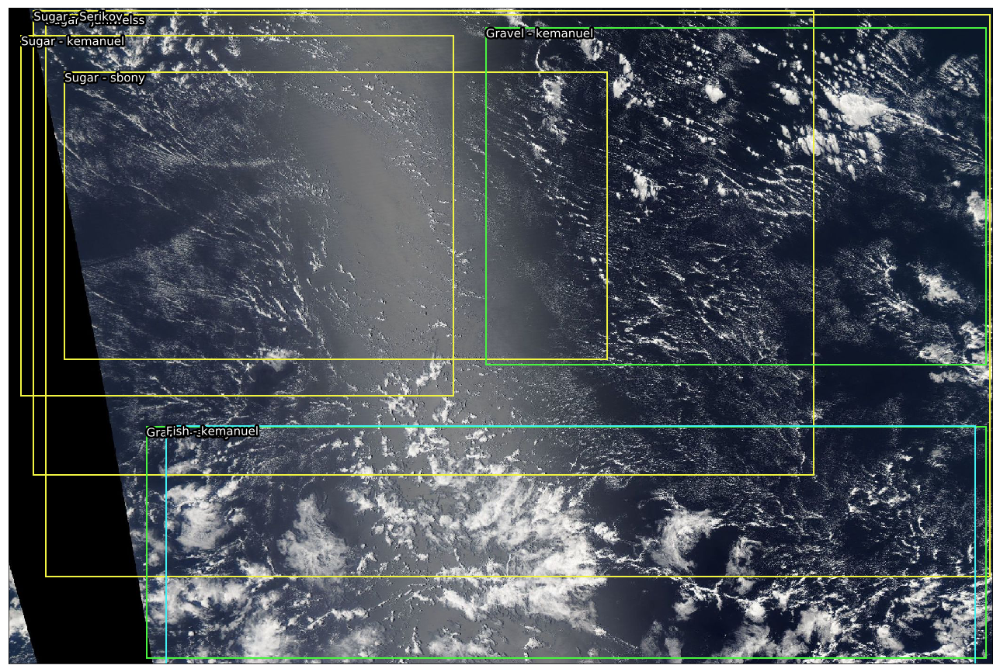

In [16]:
plot_img_with_annos(subject_ids[30], IMGDIR, annos)

## Metric

As you can see from the example image above there is a lot of overlap. You suggestion was to basically create a segmentation mask with the most likely class for each pixel. There will be a lot of situations, however, where there is a 50/50 toss between two classes between different users.

If you only look at one user, the amount of overlap is drastically smaller as you can see here.

In [20]:
users = annos[annos.subject_ids == subject_ids[30]].user_name.unique(); users

array(['jan.welss', 'Serikov', 'sbony', 'kemanuel'], dtype=object)

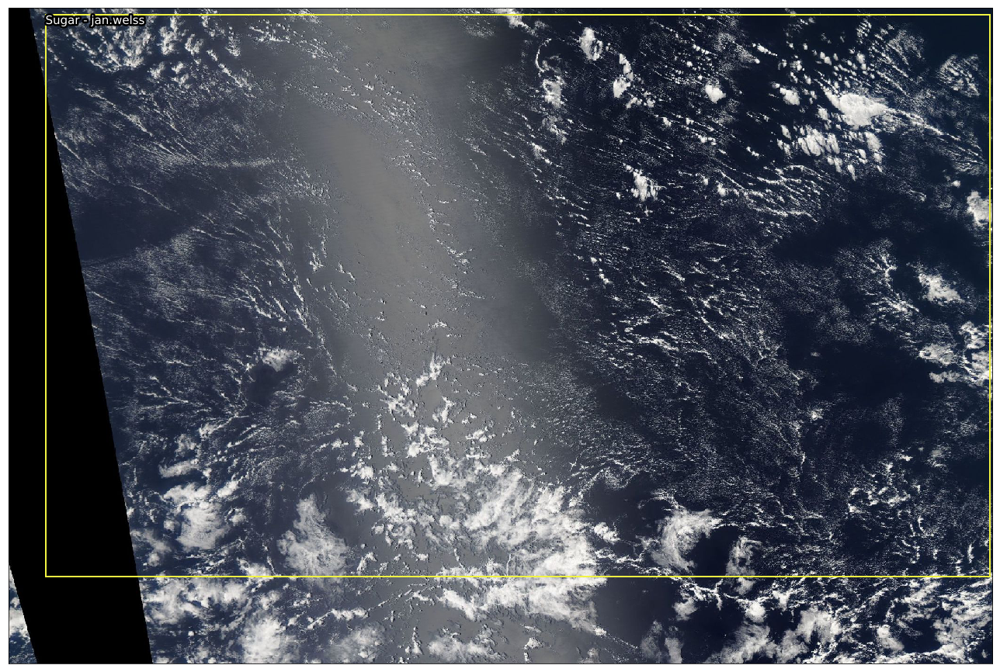

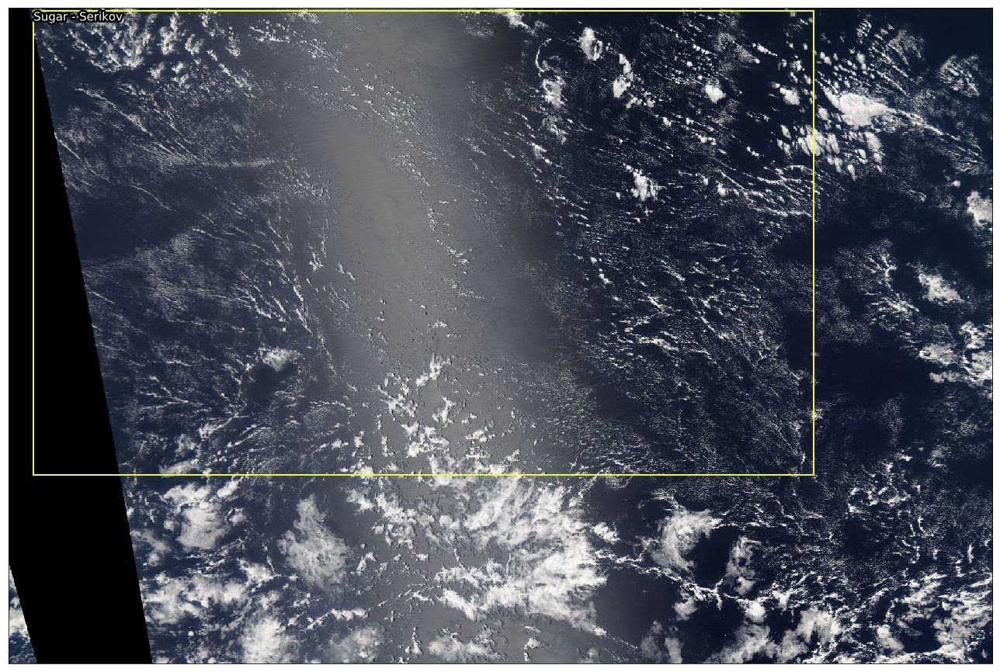

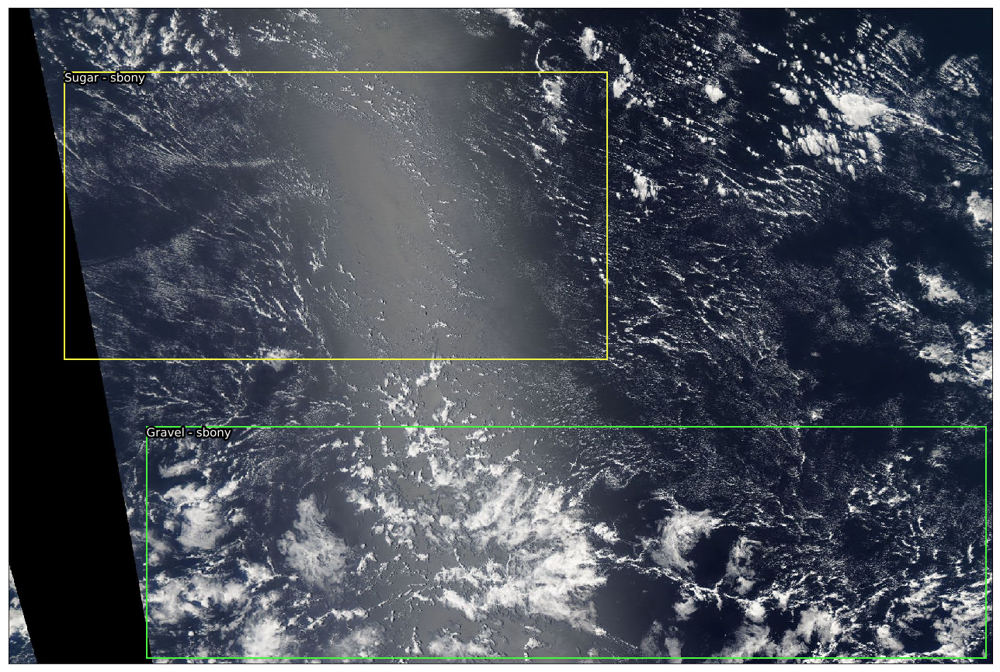

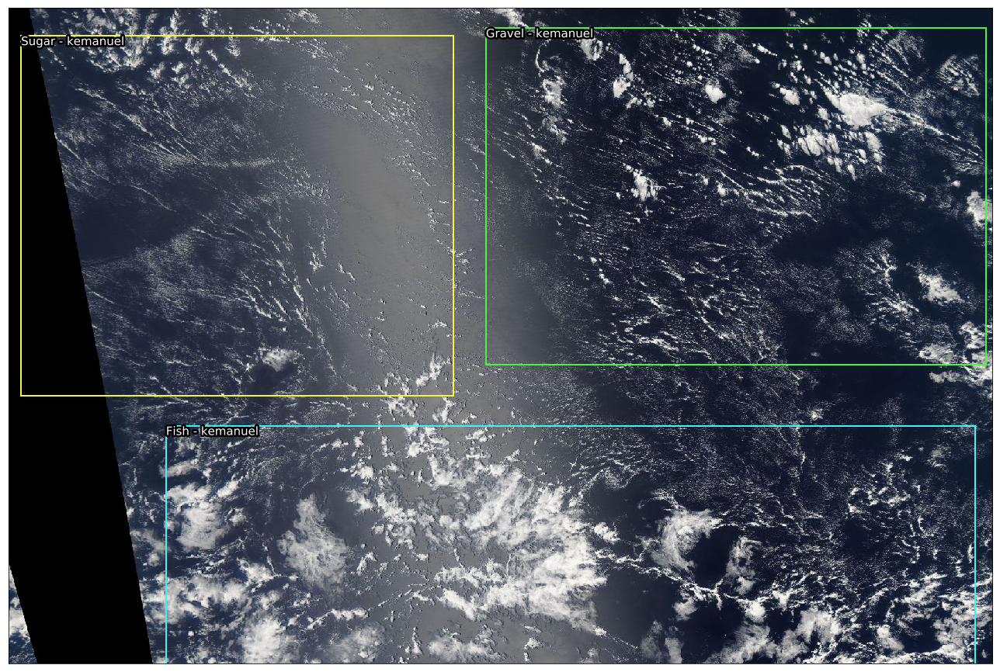

In [21]:
for u in users:
    plot_img_with_annos(subject_ids[30], IMGDIR, annos, user=u)

So here is my suggestion. Does it need to be one truth label per image? Could you not score the predictions against each user, so that would be four scores above, and then take the mean?

That way you could include some of the uncertainty in the dataset. 